In [1]:
!pip install opencv-python
import cv2
import numpy as np
import matplotlib.pyplot as plt

Defaulting to user installation because normal site-packages is not writeable


In [2]:
def show(img):
    img=cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    plt.imshow(img, cmap='gray')
    plt.xticks([]), plt.yticks([])  # to hide tick values on X and Y axis
    plt.show()

In [3]:
#This function will plot two images side by side
def plot_image(image_1, image_2,title_1="Orignal",title_2="New Image"):
    plt.figure(figsize=(10,10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(image_1, cv2.COLOR_BGR2RGB))
    plt.title(title_1)
    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(image_2, cv2.COLOR_BGR2RGB))
    plt.title(title_2)
    plt.show()

In [4]:
path=r"luffy_wallpaper.jpeg"

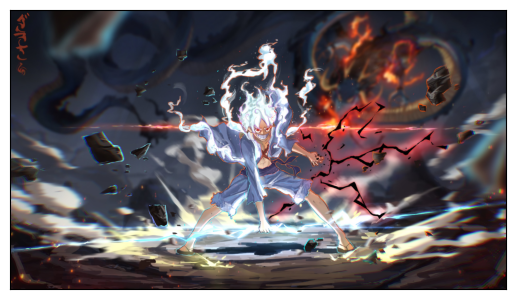

In [5]:
mechanism=cv2.imread(path)
show(mechanism)

In [6]:
print("Type of image is {}".format(type(mechanism)))

Type of image is <class 'numpy.ndarray'>


In [7]:
#Dimension for image
print("Dimension for image is {}".format(mechanism.shape))

Dimension for image is (2160, 3840, 3)


In [8]:
print(mechanism.dtype)

uint8


first lets start with thresholding

In [10]:
# first types:-> binary thresholding
# grayscale conversion is neccasary
# cv2.threshold() expects a single-channel grayscale image.
# If you apply it directly to a 3-channel color image, it may produce unexpected results.

def binary_thresholding(image, threshold_value=127, max_val=255):
    
    ret, thresh1 = cv2.threshold(image, threshold_value, max_val, cv2.THRESH_BINARY)
    return thresh1

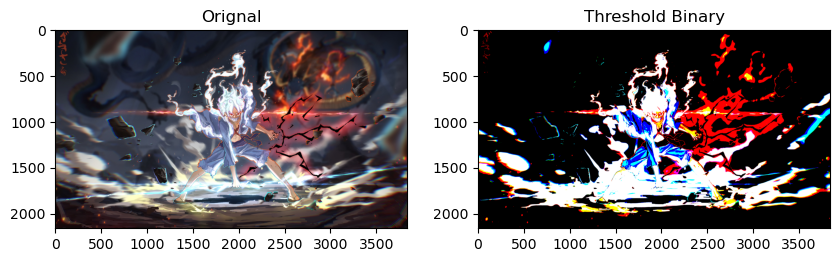

In [11]:
image_thresh=binary_thresholding(mechanism)
plot_image(mechanism, image_thresh, title_2="Threshold Binary")
# this is the ouput if we dont convert to gray scale first

this is what happens if we don't convert to grascale .. no binary output

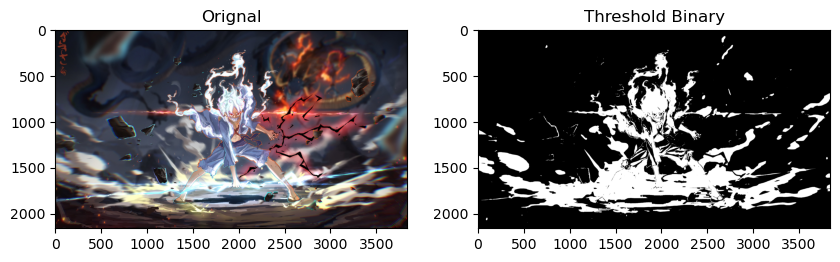

In [13]:
gray = cv2.cvtColor(mechanism, cv2.COLOR_BGR2GRAY)
image_thresh=binary_thresholding(gray)
plot_image(mechanism, image_thresh, title_2="Threshold Binary")

now it's good.. 
now we can have customised threshold values

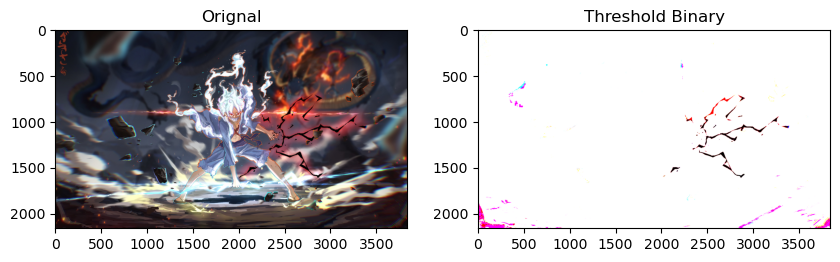

In [15]:
image_thresh=binary_thresholding(mechanism, 10, 255)

plot_image(mechanism, image_thresh, title_2="Threshold Binary")

so let's now increase threshold values

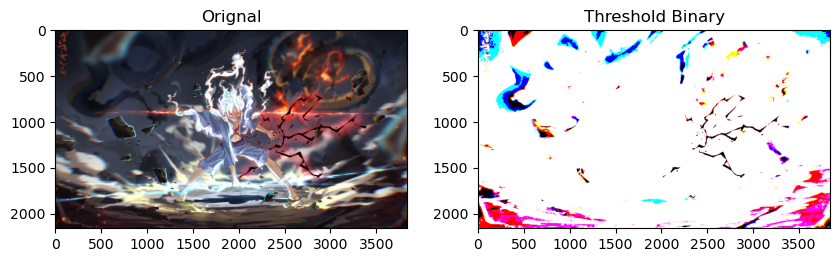

In [17]:
image_thresh=binary_thresholding(mechanism, 20, 255)

plot_image(mechanism, image_thresh, title_2="Threshold Binary")

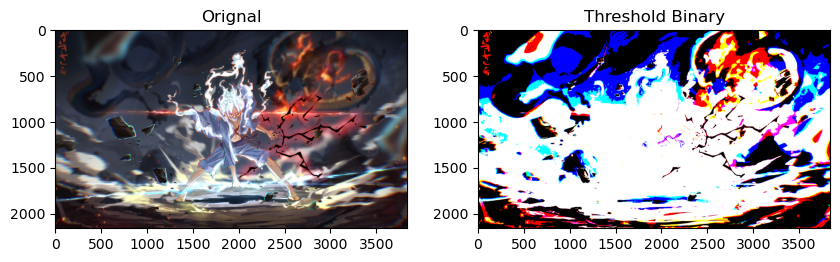

In [18]:
image_thresh=binary_thresholding(mechanism, 50, 255)

plot_image(mechanism, image_thresh, title_2="Threshold Binary")

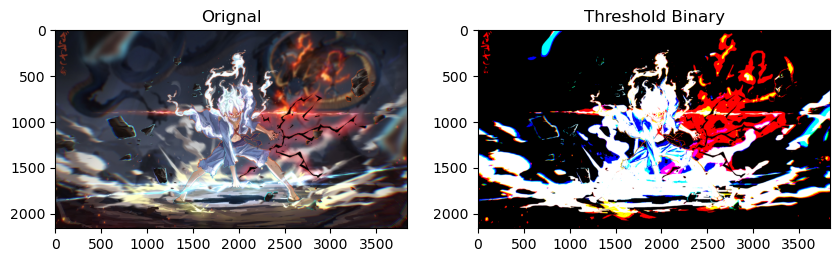

In [19]:
image_thresh=binary_thresholding(mechanism, 100, 255)

plot_image(mechanism, image_thresh, title_2="Threshold Binary")

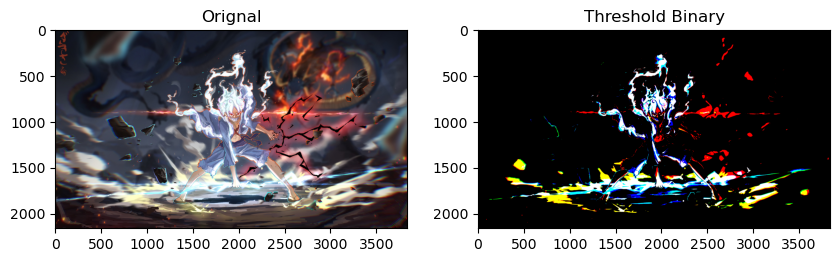

In [20]:
image_thresh=binary_thresholding(mechanism, 215, 255)

plot_image(mechanism, image_thresh, title_2="Threshold Binary")

we get the jist right.. on increasing threshold values

Now let's see adaptive mean threshold .
Adaptive thresholding the threshold value for each pixel is determined individually based on a small region around it. Thus we get different thresholds for different regions of the image and so this method performs well on images with varying illumination.

In [23]:
def adaptive_mean_thresholding(img, max_Value=255, blok_size=11, C_dst=2):
    
    th = cv2.adaptiveThreshold(img, max_Value, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blok_size, C_dst)
    
    return th

In [24]:
def get_grayscale(image):
    return cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

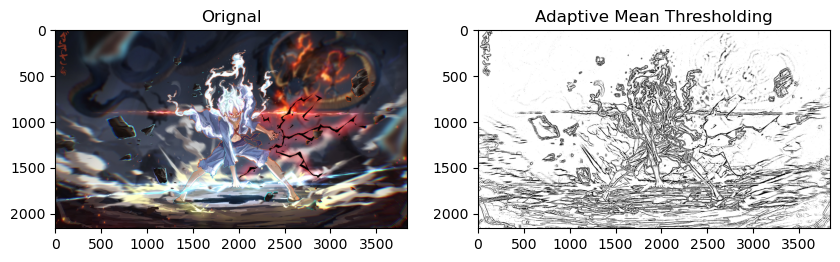

In [25]:
img_gray = get_grayscale(mechanism)

image_mean_thresh=adaptive_mean_thresholding(img_gray)

plot_image(mechanism, image_mean_thresh, title_2='Adaptive Mean Thresholding')


thus we can see better object detection

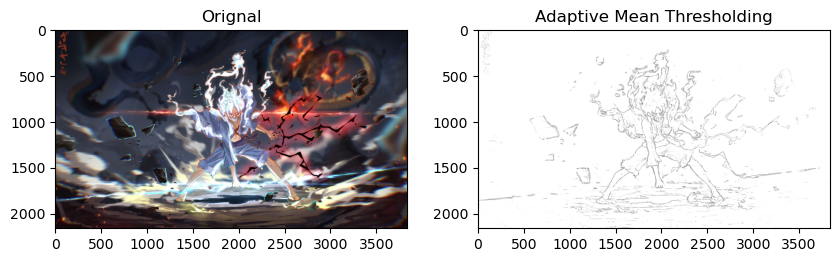

In [27]:
img_gray = get_grayscale(mechanism)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 3, 5)

plot_image(mechanism, image_mean_thresh, title_2='Adaptive Mean Thresholding')

this is customised

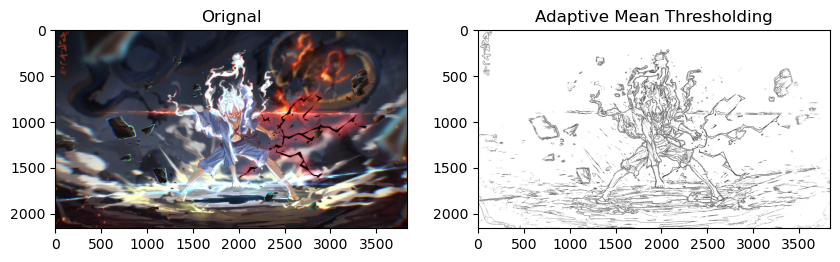

In [29]:
img_gray=get_grayscale(mechanism)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 7, 4)

plot_image(mechanism, image_mean_thresh, title_2='Adaptive Mean Thresholding')

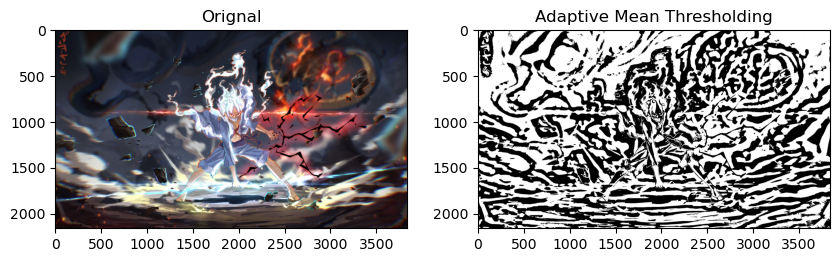

In [30]:
img_gray = get_grayscale(mechanism)

image_mean_thresh=adaptive_mean_thresholding(img_gray, 255, 99, 3)

plot_image(mechanism, image_mean_thresh, title_2='Adaptive Mean Thresholding')


now we start with adaptive gaussian threshold

In [32]:
def adaptive_gaussian_thresholding(img, max_Value=255, blok_size=11, C_dst=2):
    
    th = cv2.adaptiveThreshold(img, max_Value, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, blok_size, C_dst)
    return th

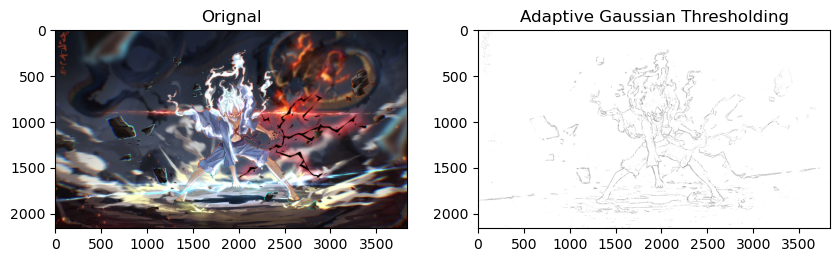

In [33]:
img_gray = get_grayscale(mechanism)

image_mean_thresh=adaptive_gaussian_thresholding(img_gray, 255, 3, 5)

plot_image(mechanism, image_mean_thresh, title_2='Adaptive Gaussian Thresholding')

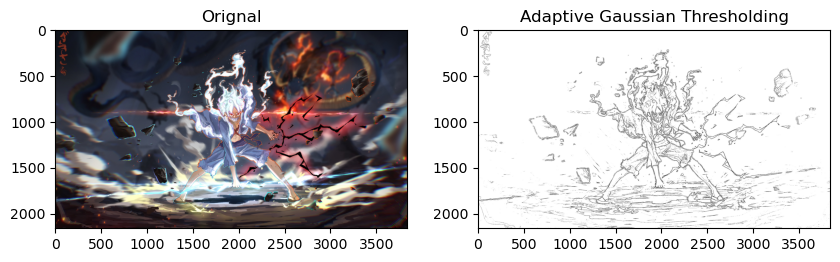

In [34]:
img_gray = get_grayscale(mechanism)

th2 = adaptive_gaussian_thresholding(img_gray, 255, 7, 4)

plot_image(mechanism, th2, title_2='Adaptive Gaussian Thresholding')

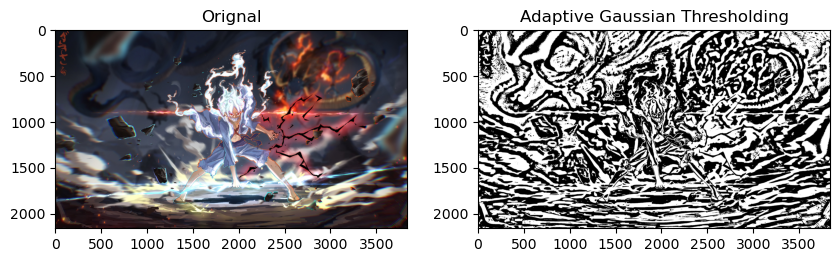

In [35]:
img_gray = get_grayscale(mechanism)

th2 = adaptive_gaussian_thresholding(img_gray, 255, 115, 1)

plot_image(mechanism, th2, title_2='Adaptive Gaussian Thresholding')


otsu thresholding


In [37]:
def otsu_thresholding(image, value=0, m=255):
    
    return cv2.threshold(image, value, m, cv2.THRESH_BINARY + cv2.THRESH_OTSU)[1]

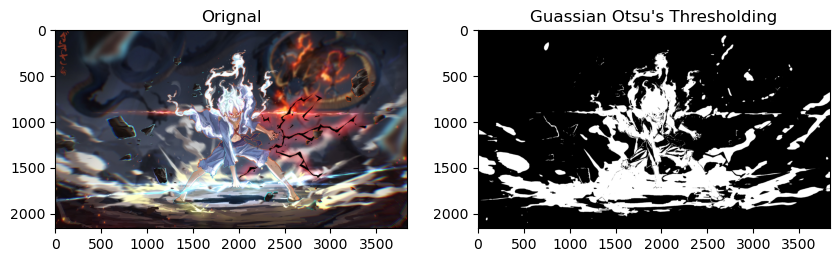

In [38]:
img_gray = get_grayscale(mechanism)

image_otsu_thresh=otsu_thresholding(img_gray, 125, 255)

plot_image(mechanism, image_otsu_thresh, title_2="Guassian Otsu's Thresholding")


Lets start with MORPHOLOGICAL TRANSFORMATION.

Morphological transformations are some simple operations based on the image shape. It is normally performed on binary images. It needs two inputs, one is our original image, second one is called structuring element or kernel which decides the nature of operation.

Erosion

The basic idea of erosion is just like soil erosion only, it erodes away the boundaries of foreground object

It is useful for removing small white noises.
Used to detach two connected objects etc.

In [40]:
def erode(image, kernel=(5, 5), iterations=1):
    
    return cv2.erode(image, np.ones(kernel,np.uint8), iterations)

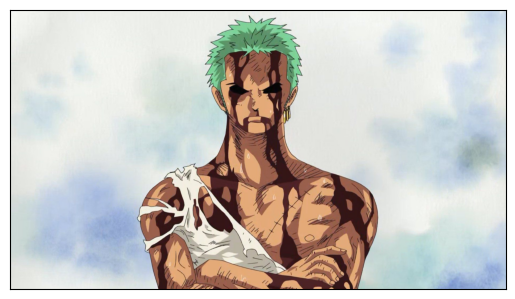

In [41]:
zoro=cv2.imread(r'nothing_happened.jpg')
show(zoro)

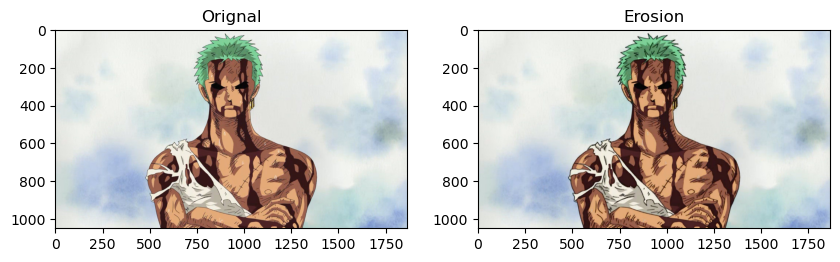

In [42]:
image_erosion=erode(zoro, (3, 3), 1)
plot_image(zoro, image_erosion, title_2="Erosion")

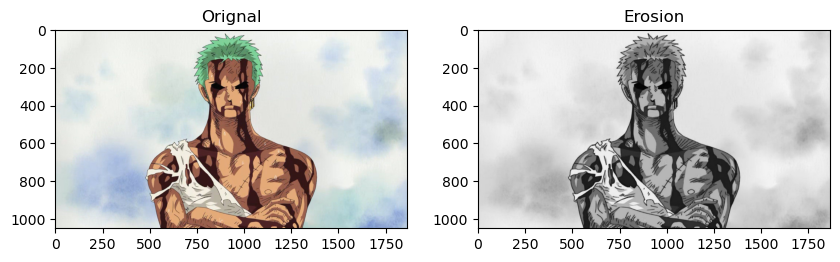

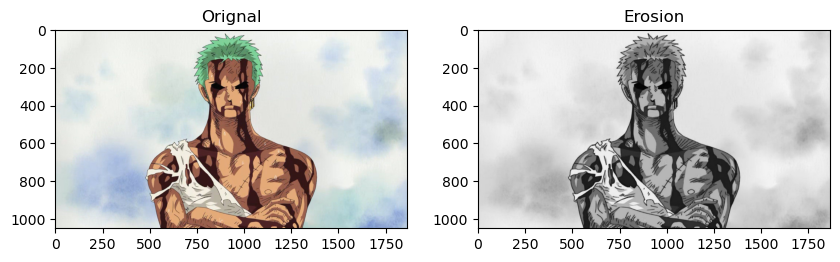

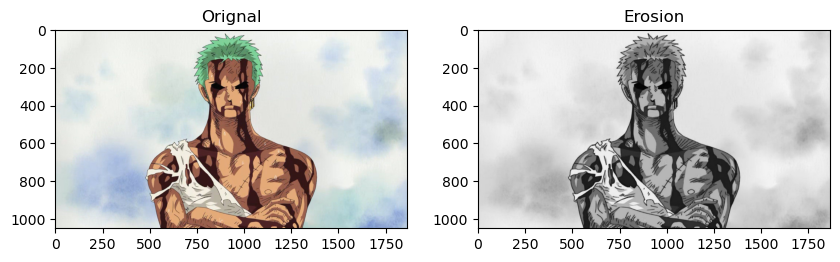

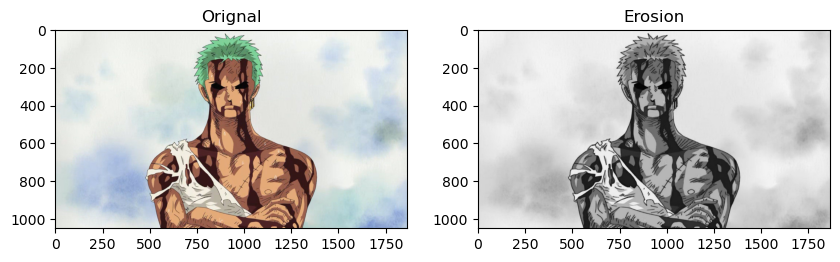

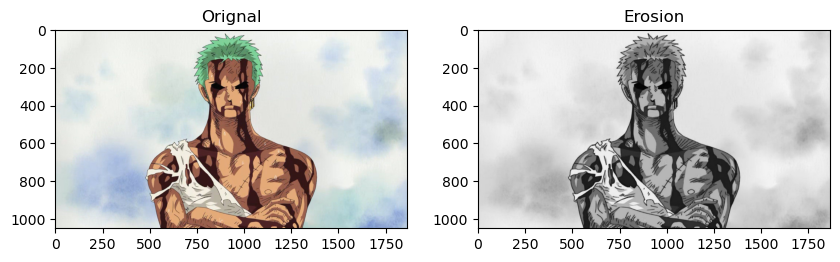

In [43]:
for i in range(1, 6):
    image = get_grayscale(zoro)

    image_erosion=erode(image, (3, 3), i)

    plot_image(zoro, image_erosion, title_2="Erosion")

Dilation

It is just opposite of erosion

In cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won’t come back, but our object area increases.
It is also useful in joining broken parts of an object.

In [45]:
#dilation
def dilation(image, kernel=(5, 5), iterations=1):
    
    return cv2.dilate(image, np.ones(kernel, np.uint8), iterations)

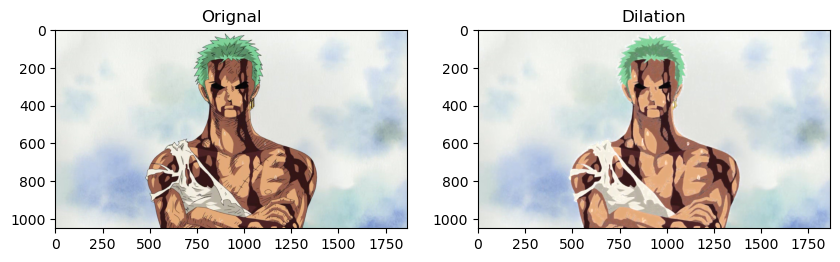

In [46]:
image_dilation=dilation(zoro)

plot_image(zoro, image_dilation, title_2="Dilation")

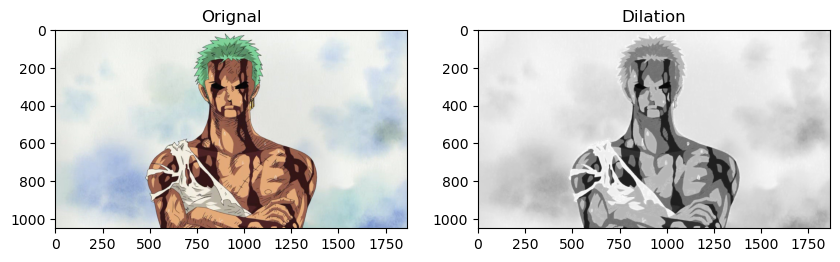

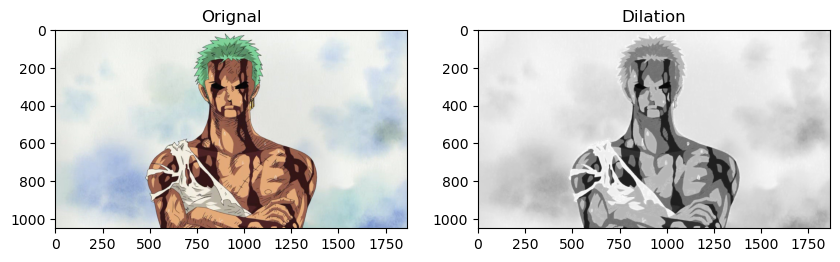

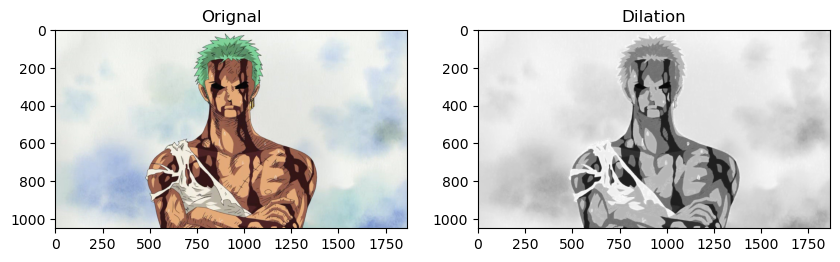

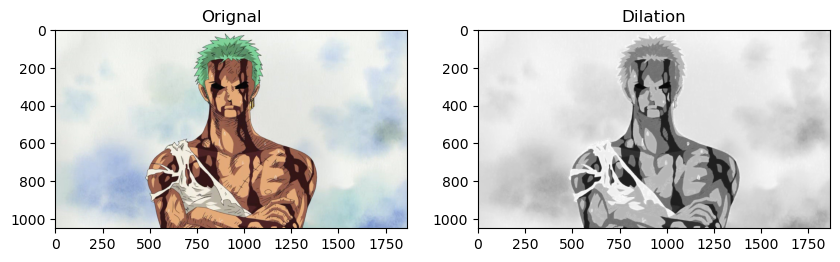

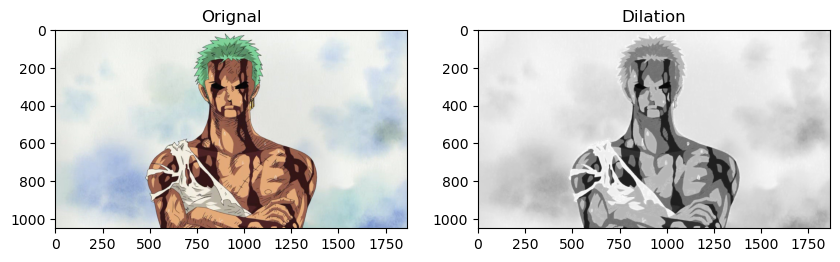

In [47]:
for i in range(1, 6):
    
    gray=get_grayscale(zoro)

    image_dilation=dilation(gray, iterations=i)

    plot_image(zoro, image_dilation, title_2="Dilation")

Opening

Opening is just another name of erosion followed by dilation

In [49]:
#opening - erosion followed by dilation
# Opening - Good for removing noise
def opening(image, kernel=(5, 5)):
    return cv2.morphologyEx(image, cv2.MORPH_OPEN, kernel=np.ones(kernel, np.uint8))

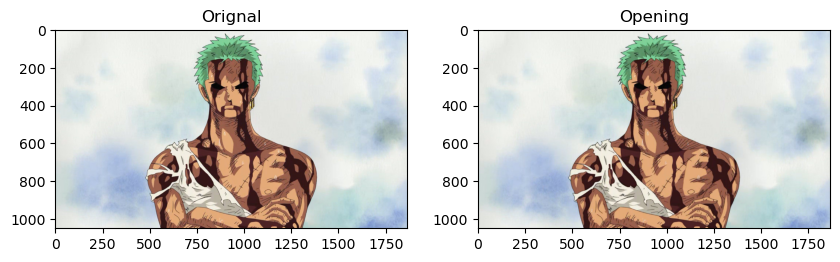

In [50]:
image_opening=opening(zoro, (3, 3))

plot_image(zoro, image_opening, title_2="Opening")

Closing

Closing is reverse of Opening, Dilation followed by Erosion. It is useful in closing small holes inside the foreground objects, or small black points on the object.

In [52]:
# Closing - Good for removing noise
def closing(image, kernel=(5, 5)):
    closing = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel=np.ones(kernel, np.uint8))
    return closing

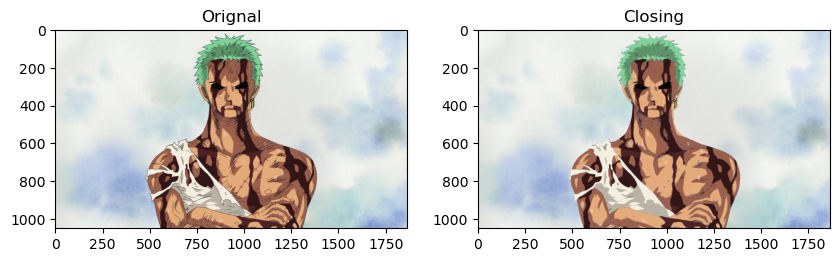

In [53]:
image_closing=closing(zoro, (4, 4))

plot_image(zoro, image_closing, title_2='Closing')

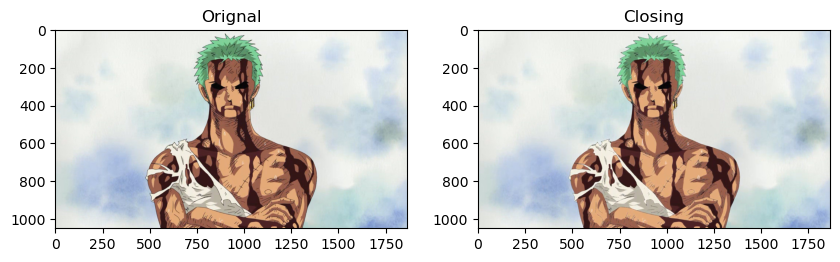

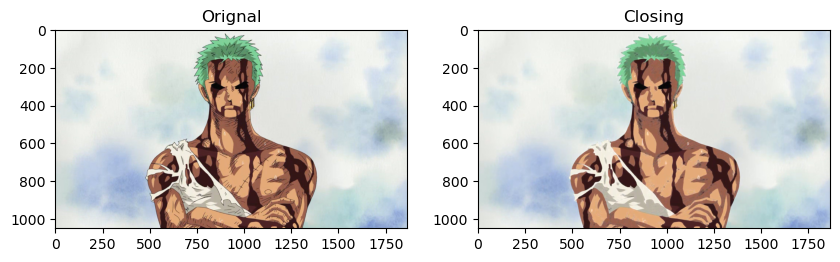

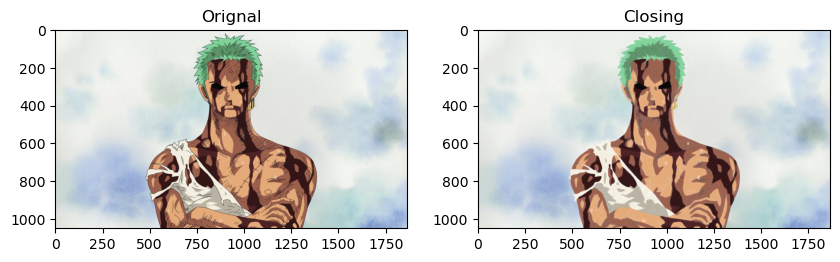

In [54]:
kernel_sizes = [(3, 3), (5, 5), (7, 7)]

for k_s in kernel_sizes:
    
    image_closing=closing(zoro, k_s)

    plot_image(zoro, image_closing, title_2='Closing')

Morphological Gradient

It is the difference between dilation and erosion of an image.

In [56]:
def morphological_gradient(image, kernel=(2, 2)):
    
    gradient = cv2.morphologyEx(image, cv2.MORPH_GRADIENT, kernel=np.ones((2, 2), np.uint8))
    
    return gradient

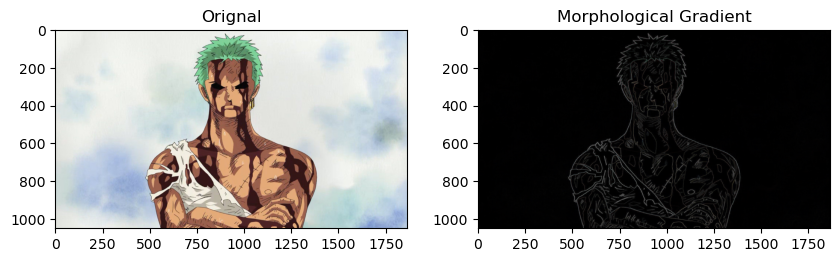

In [57]:
image_gradient=morphological_gradient(zoro, (5, 5))

plot_image(zoro, image_gradient, title_2="Morphological Gradient")

Top hat

It is the difference between input image and Opening of the image


In [59]:
def top_hat(image, kernel=(5, 5)):
    
    tophat = cv2.morphologyEx(image, cv2.MORPH_TOPHAT, kernel=np.ones(kernel, np.uint8))
    
    return tophat

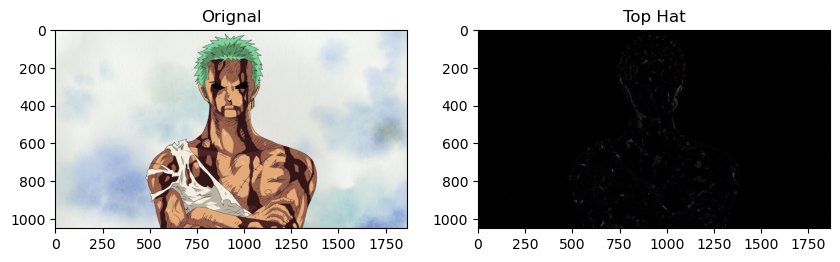

In [60]:
image_top_hat=top_hat(zoro)

plot_image(zoro, image_top_hat,title_2= "Top Hat")

Black hat

It is the difference between the closing of the input image and input image.

In [62]:
def black_hat(image, kernel=(4, 4)):
    
    blackhat = cv2.morphologyEx(image, cv2.MORPH_BLACKHAT, kernel=np.ones(kernel, np.uint8))
    
    return blackhat

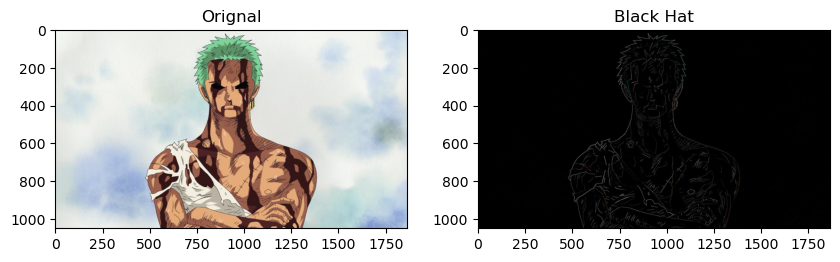

In [63]:
image_black_hat=black_hat(zoro)

plot_image(zoro, image_black_hat, title_2="Black Hat")